# Epidemic Rewiring RL Agent — Summary

We built a reinforcement learning environment where an agent learns to control the spread of an epidemic on a dynamic network by rewiring the network over time.

The agent interacts with:
- an evolving SEIR epidemic simulation
- a rewiring mechanism it controls
- rewards that balance health outcomes and social connectivity

We implemented this in a custom Gymnasium-compatible environment for Stable Baselines3.

Let's build a framework that's as realistic as possible. We want to align the model with actual decision-making power during a pandemic and reflects how societies operate.

---

## 🧭 Formalized Research Question

> **“Can epidemic control policies preserve public health without heavily compromising social connectivity?”**

Or more precisely:

> **“Can a government-like agent learn to mitigate epidemic spread by selecting interpretable, population-level social strategies that balance infection suppression with the preservation of social contact?”**

This question centers around *interpretable, implementable policies*, rather than low-level rewiring.

In [6]:
!pip install stable-baselines3[extra] > /dev/nul
!pip install EoN > /dev/null
!pip install shimmy > /dev/null
!pip install gymnasium > /dev/null

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
kaggle-environments 1.16.11 requires shimmy>=1.2.1, but you have shimmy 1.1.0 which is incompatible.
dopamine-rl 4.1.2 requires ale-py>=0.10.1, but you have ale-py 0.8.1 which is incompatible.
dopamine-rl 4.1.2 requires gymnasium>=1.0.0, but you have gymnasium 0.29.0 which is incompatible.


In [7]:
# Core libraries
import random
import time
from collections import defaultdict
import datetime, os
import multiprocessing

# Scientific libraries
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

# Epidemic modeling
import EoN

# RL + environment tools
import gymnasium as gym
from gymnasium import spaces, Env
from scipy.ndimage import shift

# Stable Baselines3 (RL algorithms)
from stable_baselines3 import PPO
from stable_baselines3.common.callbacks import EvalCallback
from stable_baselines3.common.monitor import Monitor
from stable_baselines3.common.vec_env import DummyVecEnv
from stable_baselines3.common.vec_env import SubprocVecEnv

# Progress tracking
from tqdm.notebook import tqdm
# import tensorflow as tf

2025-06-13 18:19:19.707309: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749838759.739430      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749838759.749024      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [8]:
class PolicyDrivenEpidemicModel:
    """
    Epidemic simulation model governed by discrete, interpretable social policies.
    Each policy determines how the social graph is rewired before advancing the epidemic.
    """

    def __init__(self, graph, initially_infected_fraction=0.05, rho = 0.1, TE = 7, TI = 14, dbg=False, p_death=0.1, enable_deaths=False):
        self.graph = graph.copy()
        self.num_nodes = self.graph.number_of_nodes()
        self.initially_infected_fraction = initially_infected_fraction
        self.enable_deaths = enable_deaths  # 🔁 Flag to support death logic later

        # Epidemic state
        self.current_status = defaultdict(lambda: 'S')
        for node in self.graph.nodes:
            self.current_status[node] = 'S'
        self._seed_infection()
        self.t = 0

        # Spontaneous transitions: internal clock-based state changes (days between transitions)
        self.spontaneous_transitions = nx.DiGraph()
        self.spontaneous_transitions.add_node('S')  # S has no spontaneous transitions
        self.spontaneous_transitions.add_edge('E', 'I', rate=1 / TE)   # On average, exposed → infected in 7 steps (≈7 days)

        if self.enable_deaths:
            self.spontaneous_transitions.add_edge('I', 'R', rate=(1 - p_death) / self.TI)
            self.spontaneous_transitions.add_edge('I', 'D', rate=p_death / self.TI)  # On average, infected → dead in ? steps
        else:
          self.spontaneous_transitions.add_edge('I', 'R', rate=1 / TI)  # On average, infected → recovered in 14 steps

        # Neighbor-induced transitions: contact-based infections
        self.contact_transmissions = nx.DiGraph()
        self.contact_transmissions.add_edge(('I', 'S'), ('I', 'E'), rate=rho)  # S becomes E with contact from I (infection rate)
        # the transition S → E occurs at a rate of 0.1 per unit time (≈ per day).
        # The mean time until infection via contact with an infected neighbor is 1 / 0.1 = 10 days.

        self.n_family = 2
        self.strong_ties = self._get_strong_ties(n=self.n_family)

        degrees = [deg for _, deg in self.graph.degree()]
        self.max_deg = np.max(degrees) - self.n_family
        avg_deg = np.mean(degrees) - self.n_family
        self.initial_avg_deg = avg_deg / self.max_deg
        self.last_rewiring_cost = 0
        self.last_action = None  # Used in obs if enabled

        # Bind policy methods to names
        self.policy_map = {
            "normal": self._policy_normal,
            "moderate_distancing": self._policy_moderate_distancing,
            "strict_distancing": self._policy_strict_distancing,
            "quarantine": self._policy_quarantine,
        }
        self.debug = dbg

    def _seed_infection(self):
        """Randomly infect a small fraction of nodes."""
        initial_infected = random.sample(list(self.graph.nodes),
                                         max(1, int(self.initially_infected_fraction * self.num_nodes)))
        for node in initial_infected:
            self.current_status[node] = 'I'

    def apply_policy(self, policy_name):
        """
        Apply a predefined rewiring strategy based on a population-level policy name.
        """
        if policy_name not in self.policy_map:
            raise ValueError(f"Unknown policy: {policy_name}")
        self.last_action = list(self.policy_map.keys()).index(policy_name)
        self.policy_map[policy_name]()

    def _get_strong_ties(self, n=2):
        """Assign each node 2 persistent 'strong ties' (e.g family, close friends)"""
        self.strong_ties = {}
        for node in self.graph.nodes():
            neighbors = list(self.graph.neighbors(node))
            if len(neighbors) >= 2:
                self.strong_ties[node] = random.sample(neighbors, 2)
            else:
                self.strong_ties[node] = neighbors
        return self.strong_ties


    def _policy_normal(self):
        """
        Light social dynamics:
        - Every person drops 1 weak edge
        - Forms 1 new tie
        - Keeps 2 strong ties intact
        """
        weak_edges = [e for e in self.graph.edges if
                      e[1] not in self.strong_ties.get(e[0], []) and
                      e[0] not in self.strong_ties.get(e[1], [])]

        n = self.num_nodes
        edges_to_churn = min(n, len(weak_edges))  # 1 per node, or as many as exist

        to_remove = random.sample(weak_edges, edges_to_churn)
        self.graph.remove_edges_from(to_remove)

        # Add back the same number of new random edges
        possible_new = [(u, v) for u in self.graph.nodes for v in self.graph.nodes
                        if u < v and not self.graph.has_edge(u, v)]

        edges_to_churn = max(int(1.2*edges_to_churn), 50)
        to_add = random.sample(possible_new, edges_to_churn)
        self.graph.add_edges_from(to_add)


        if self.debug:
          print(f"[Normal] Weak removed: {len(to_remove)} | "
              f"Added: {len(to_add)}")


    def _policy_moderate_distancing(self):
        """
        Moderate distancing policy:
        - Reduces risky contact (S-I, S-E)
        - Allows limited social rewiring (S-R, S-S, low chance of S-E)
        - Movement is reduced but not eliminated
        """

        def sample_edges(edges, fraction, num_edges):
            return random.sample(edges, min(len(edges), int(fraction * num_edges)))

        def generate_possible_pairs(group_a, group_b):
            return [(a, b) for a in group_a for b in group_b if a != b and not self.graph.has_edge(a, b)]

        degrees = [deg for _, deg in self.graph.degree()]
        avg_deg = (np.mean(degrees) - self.n_family) / self.max_deg
        stay_around = False
        if avg_deg < .8 * self.initial_avg_deg:
          stay_around = True

        # --- Node groups ---
        s_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'S']
        e_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'E']
        i_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'I']
        r_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'R']
        sr_nodes = s_nodes + r_nodes

        # --- Identify risky connections to cut ---
        si_edges = [(u, v) for u, v in self.graph.edges if {'S', 'I'} == {self.current_status[u], self.current_status[v]}]
        se_edges = [(u, v) for u, v in self.graph.edges if {'S', 'E'} == {self.current_status[u], self.current_status[v]}]

        cut_si = sample_edges(si_edges, 0.2, len(si_edges))  # strong avoidance
        cut_se = sample_edges(se_edges, 0.05, len(se_edges))  # moderate avoidance

        weak_edges = [
            (u, v) for (u, v) in self.graph.edges
            if v not in self.strong_ties.get(u, []) and u not in self.strong_ties.get(v, [])
            and (u, v) not in cut_si and (u, v) not in cut_se
        ]
        cut_random = sample_edges(weak_edges, 1, self.num_nodes)  # 1 weak edge per person

        self.graph.remove_edges_from(cut_si + cut_se + cut_random)

        # --- Add neutral or low-risk social edges ---
        sr_pairs = generate_possible_pairs(s_nodes, r_nodes)
        ss_pairs = [(s1, s2) for i, s1 in enumerate(s_nodes) for s2 in s_nodes[i + 1:] if not self.graph.has_edge(s1, s2)]
        se_pairs = generate_possible_pairs(sr_nodes, e_nodes)

        # Controlled additions based on number of lost connections
        max_add = int(min(0.92 * len(cut_random), 0.85 * self.num_nodes)) if not stay_around else int(1.1*min(len(cut_random), self.num_nodes))
        add_sr_ss = random.sample(sr_pairs + ss_pairs, min(len(sr_pairs + ss_pairs), max_add))
        add_se = sample_edges(se_pairs, 0.4, int(len(cut_si + cut_se)))

        self.graph.add_edges_from(add_sr_ss + add_se)

        # Stats for debugging
        self.removed = len(cut_si) + len(cut_se) + len(cut_random)
        self.added = len(add_sr_ss) + len(add_se)

        if self.debug:
          print(f"[Moderate] Removed edges: SI={len(cut_si)}, SE={len(cut_se)}, Weak={len(cut_random)} | "
              f"Added edges: SR/SS={len(add_sr_ss)}, SE={len(add_se)}")

    def _policy_strict_distancing(self):
        """
        Strict distancing policy:
        - Cuts most risky edges (S-I, S-E)
        - Cuts more weak edges (2 per person)
        - Very limited rewiring (mostly safe S–R and S–S)
        """

        def sample_edges(edges, fraction, num_edges):
            return random.sample(edges, min(len(edges), int(fraction * num_edges)))

        def generate_possible_pairs(group_a, group_b):
            return [(a, b) for a in group_a for b in group_b if a != b and not self.graph.has_edge(a, b)]

        degrees = [deg for _, deg in self.graph.degree()]
        avg_deg = (np.mean(degrees) - self.n_family) / self.max_deg
        stay_around = False
        if avg_deg < .5 * self.initial_avg_deg:
          stay_around = True

        # --- Node groups ---
        s_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'S']
        r_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'R']
        i_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'I']
        e_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'E']
        sr_nodes = s_nodes + r_nodes

        # --- Edges to cut ---
        si_edges = [(u, v) for u, v in self.graph.edges if {'S', 'I'} == {self.current_status[u], self.current_status[v]}]
        se_edges = [(u, v) for u, v in self.graph.edges if {'S', 'E'} == {self.current_status[u], self.current_status[v]}]

        cut_si = sample_edges(si_edges, 0.5, len(si_edges))  # very strong avoidance
        cut_se = sample_edges(se_edges, 0.25, len(se_edges))  # more than moderate avoidance

        weak_edges = [
            (u, v) for (u, v) in self.graph.edges
            if v not in self.strong_ties.get(u, []) and u not in self.strong_ties.get(v, [])
            and (u, v) not in cut_si and (u, v) not in cut_se
        ]
        cut_random = sample_edges(weak_edges, 1.2, self.num_nodes)  # 1.2 weak edges per person

        self.graph.remove_edges_from(cut_si + cut_se + cut_random)

        # --- Edges to add (limited social rewiring) ---
        sr_pairs = generate_possible_pairs(s_nodes, r_nodes)
        ss_pairs = [(s1, s2) for i, s1 in enumerate(s_nodes) for s2 in s_nodes[i + 1:] if not self.graph.has_edge(s1, s2)]

        max_add = int(min(0.7 * len(cut_random), 0.6 * self.num_nodes)) if not stay_around else int(1.1*min(len(cut_random), self.num_nodes))
        add_sr_ss = random.sample(sr_pairs + ss_pairs, min(len(sr_pairs + ss_pairs), max_add))

        self.graph.add_edges_from(add_sr_ss)

        self.removed = len(cut_si) + len(cut_se) + len(cut_random)
        self.added = len(add_sr_ss)
        if self.debug:
          print(f"[Strict] Removed: SI={len(cut_si)}, SE={len(cut_se)}, Weak={len(cut_random)} | "
              f"Added: SR/SS={len(add_sr_ss)}")

    def _policy_quarantine(self):
        """
        Strict distancing policy:
        - Cuts most risky edges (S-I, S-E)
        - Cuts more weak edges (2 per person)
        - Very limited rewiring (mostly safe S–R and S–S)
        """

        def sample_edges(edges, fraction, num_edges):
            return random.sample(edges, min(len(edges), int(fraction * num_edges)))

        def generate_possible_pairs(group_a, group_b):
            return [(a, b) for a in group_a for b in group_b if a != b and not self.graph.has_edge(a, b)]

        degrees = [deg for _, deg in self.graph.degree()]
        avg_deg = (np.mean(degrees) - self.n_family) / self.max_deg
        stay_around = False
        if avg_deg < .3 * self.initial_avg_deg:
          stay_around = True

        # --- Node groups ---
        s_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'S']
        r_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'R']
        i_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'I']
        e_nodes = [n for n in self.graph.nodes if self.current_status[n] == 'E']
        sr_nodes = s_nodes + r_nodes

        # --- Edges to cut ---
        si_edges = [(u, v) for u, v in self.graph.edges if {'S', 'I'} == {self.current_status[u], self.current_status[v]}]
        se_edges = [(u, v) for u, v in self.graph.edges if {'S', 'E'} == {self.current_status[u], self.current_status[v]}]

        cut_si = sample_edges(si_edges, 0.933, len(si_edges))  # very strong avoidance
        cut_se = sample_edges(se_edges, 0.6, len(se_edges))  # more than moderate avoidance

        weak_edges = [
            (u, v) for (u, v) in self.graph.edges
            if v not in self.strong_ties.get(u, []) and u not in self.strong_ties.get(v, [])
            and (u, v) not in cut_si and (u, v) not in cut_se
        ]
        cut_random = sample_edges(weak_edges, 1.5, self.num_nodes)  # 2 weak edges per person

        self.graph.remove_edges_from(cut_si + cut_se + cut_random)

        # --- Edges to add (limited social rewiring) ---
        sr_pairs = generate_possible_pairs(s_nodes, r_nodes)
        ss_pairs = [(s1, s2) for i, s1 in enumerate(s_nodes) for s2 in s_nodes[i + 1:] if not self.graph.has_edge(s1, s2)]

        max_add = int(min(0.4 * len(cut_random), 0.3 * self.num_nodes)) if not stay_around else int(1.1*min(len(cut_random), self.num_nodes))
        add_sr_ss = random.sample(sr_pairs + ss_pairs, min(len(sr_pairs + ss_pairs), max_add))

        self.graph.add_edges_from(add_sr_ss)

        self.removed = len(cut_si) + len(cut_se) + len(cut_random)
        self.added = len(add_sr_ss)
        if self.debug:
          print(f"[Quarantine] Removed: SI={len(cut_si)}, SE={len(cut_se)}, Weak={len(cut_random)} | "
                f"Added: SR/SS={len(add_sr_ss)}")

    def advance_one_step(self):
        """
        Simulate one step of epidemic progression using Gillespie dynamics.
        """
        sim = EoN.Gillespie_simple_contagion(
            G=self.graph,
            spontaneous_transition_graph=self.spontaneous_transitions,
            nbr_induced_transition_graph=self.contact_transmissions,
            IC=self.current_status,
            return_statuses=('S', 'E', 'I', 'R', 'D') if self.enable_deaths else ('S', 'E', 'I', 'R'),
            tmin=self.t,
            tmax=self.t + 1,
            return_full_data=True
        )
        last_snapshot = sim.get_statuses(self.graph.nodes(), sim.t()[-1])
        self.current_status = defaultdict(lambda: 'S', last_snapshot)
        self.t += 1

        if self.enable_deaths:
            # Remove edges connected to dead nodes
            dead_nodes = [n for n, s in self.current_status.items() if s == 'D']
            dead_edges = [(u, v) for u, v in self.graph.edges if u in dead_nodes or v in dead_nodes]
            self.graph.remove_edges_from(dead_edges)

    def compute_spatial_entropy(self):
        """
        Measures how dispersed the infection is across the network.
        """
        infected_nodes = [n for n, s in self.current_status.items() if s == 'I']
        if not infected_nodes:
            return 0.0

        degrees = dict(self.graph.degree(infected_nodes))
        total = sum(degrees.values()) or 1
        probs = np.array([deg / total for deg in degrees.values()])
        entropy = -np.sum(probs * np.log(probs + 1e-10)) / np.log(len(infected_nodes) + 1e-10)
        return entropy

    def get_state_summary(self, include_action=False, round_decimals=2):
        """
        Returns:
        - %S, %E, %I, %R
        - avg degree, degree variance
        - clustering coefficient
        - spatial entropy
        """
        counts = {'S': 0, 'E': 0, 'I': 0, 'R': 0}
        for s in self.current_status.values():
            counts[s] += 1

        S_frac = counts['S'] / self.num_nodes
        E_frac = counts['E'] / self.num_nodes
        I_frac = counts['I'] / self.num_nodes
        R_frac = counts['R'] / self.num_nodes

        degrees = [deg for _, deg in self.graph.degree()]
        avg_deg = np.mean(degrees) - self.n_family
        avg_deg = avg_deg / self.max_deg
        var_deg = np.var(degrees) / self.max_deg
        clustering = nx.average_clustering(self.graph)
        entropy = self.compute_spatial_entropy()

        base_obs = np.array([S_frac, E_frac, I_frac, R_frac,
                             avg_deg, var_deg, clustering, entropy], dtype=np.float32)

        if include_action:
            action_onehot = np.zeros(len(self.policy_map.keys()), dtype=np.float32)
            if  self.last_action is not None:
              action_onehot[self.last_action] = 1.0
            obs = np.concatenate([base_obs, action_onehot])
        else:
            obs = base_obs

        return np.round(obs, decimals=round_decimals)


    def is_extinct(self):
        """True if there are no more infected or exposed nodes."""
        return all(s not in ['I', 'E'] for s in self.current_status.values())



### 📊 **Observation Space** (`Box(0, 1, shape=(8,))`)

At every step, the agent receives a **8-dimensional discrete vector** summarizing the current state:

| Index | Feature          | Description                                                              |
| ----- | ---------------- | ------------------------------------------------------------------------ |
| 0     | S\_frac          | Fraction of susceptible individuals in the network.                      |
| 1     | E\_frac          | Fraction of exposed (infected but not yet infectious) individuals.       |
| 2     | I\_frac          | Fraction of infectious individuals.                                      |
| 3     | R\_frac          | Fraction of recovered (or removed) individuals.                          |
| 4     | avg\_deg         | Average node degree (how many connections each node has, on average).    |
| 5     | var\_deg         | Variance in node degrees (spread of connectivity).                       |
| 6     | clustering       | Average local clustering coefficient (how interconnected neighbors are). |
| 7     | spatial\_entropy | Entropy of infection spread (how spatially dispersed infections are).    |

This gives the agent a compact, generalizable summary of:
- How much infection exists.
- How concentrated or dispersed it is.
- How structurally vulnerable the network is.

A rich picture of the epidemic dynamics.

### 🎮 **Action Space** (`spaces.Discrete(action_dim)`)


* In the real world, **governments can’t see or control individual connections**.
* Policies must instead **influence population behavior**: restrictions, incentives, and guidelines.

### Agent chooses **“strategy labels”** that reflect population-level behavior:

These might include:

* `"normal"`: No restrictions. People socialize freely.
* `"moderate distancing"`: Partial distancing, reduced mobility.
* `"strict"`: Even stricter distancing, more reduced mobility.
* `"quarantine"`: Infected or high-risk individuals isolate.

The **rewiring behavior is then a consequence** of these policies, driven by rules *within the environment*. This makes the action space discrete and interpretable.


```python
self.action_space = spaces.Discrete(N)  # N = number of strategies
```

Where actions map to:

```python
strategy_map = {
    0: "normal",
    1: "moderate_distancing",
    2: "strict_distancing",
    3: "quarantine",
}
```

Each strategy defines its **internal rewiring logic** inside the environment (e.g., how people cut or rewire connections probabilistically based on the policy).

---

## Benefits of This Approach

* **Interpretability**: Each policy corresponds to a real-world decision.
* **Modularity**: Easy to plug in new strategies or simulate different government types.
* **Human-alignment**: Makes the RL policy understandable by policymakers.
* **Sociological realism**: Allows emergent behaviors in the population to arise from rules.


### 🏆 **Reward Function**

The reward at each time step is computed as:

$$
R_t = - \alpha \cdot I_t - \beta \cdot E_t + \gamma \cdot \text{min}\big(1.0, \frac{\text{avg_degree}}{\text{initial_avg_degree}}\big) - \delta \cdot S_t
$$

Where:

* $I_t$ = current infected fraction.
* $E_t$ = current exposed fraction.
* $\text{avg_degree}$ = sociality bonus. How much movement can be seen in the graph wrt a normal situation.
* $S_t$ = current susceptible fraction.

This encourages:
- keeping infections and exposures low,
- maintaining social connectivity.

In [9]:
class PolicyBasedEpidemicEnv(Env):
    """
    RL environment for learning pandemic control via interpretable social policies.
    Action = discrete policy index (e.g., "quarantine", "moderate_distancing").
    """

    metadata = {"render.modes": ["human", "plot"]}

    def __init__(self, graph, tmax, iif=0.05, rho=0.1, te=7, ti=14, iota=1.0, eta=1.0, gamma=1.0, delta=1.0, sigma=1.0, include_action_in_obs=False, debug=False):
        super().__init__()

        self.graph = graph
        self.policies = ["normal", "moderate_distancing", "strict_distancing", "quarantine"]
        self.policy_to_index = {p: i for i, p in enumerate(self.policies)}
        self.index_to_policy = {i: p for p, i in self.policy_to_index.items()}

        self.include_action_in_obs = include_action_in_obs

        self.iif = iif
        self.rho = rho
        self.te = te
        self.ti = ti
        self.engine = PolicyDrivenEpidemicModel(graph, initially_infected_fraction=iif, rho=rho, TE=te, TI=ti, dbg=debug)

        self.max_steps = tmax
        self.current_step = 0

        base_obs_dim = 8
        action_dim = len(self.policies)
        if include_action_in_obs:
            self.observation_space = spaces.Box(low=0, high=1, shape=(base_obs_dim + action_dim,), dtype=np.float32)
        else:
            self.observation_space = spaces.Box(low=0, high=1, shape=(base_obs_dim,), dtype=np.float32)

        self.action_space = spaces.Discrete(action_dim)

        # Reward coefficients
        self.iota = iota
        self.eta = eta
        self.gamma = gamma
        self.delta = delta
        self.sigma = sigma

        self.state = None
        self.debug = debug

    def reset(self, seed=315, options=None):
        super().reset(seed=seed)

        self.engine = PolicyDrivenEpidemicModel(self.graph, initially_infected_fraction=self.iif, rho=self.rho, TE=self.te, TI=self.ti, dbg=self.debug)
        self.current_step = 0
        self.engine.last_action = None
        self.state = self.engine.get_state_summary(include_action=self.include_action_in_obs)
        return self.state, {}

    def step(self, action):
        policy_name = self.index_to_policy[action]

        # Apply policy
        self.engine.apply_policy(policy_name)
        self.engine.last_action = action

        # Advance simulation
        self.engine.advance_one_step()
        self.current_step += 1

        # New observation
        self.state = self.engine.get_state_summary(include_action=self.include_action_in_obs)

        # Reward
        reward = self._compute_reward()

        # Done?
        terminated = self.engine.is_extinct()
        truncated = self.current_step >= self.max_steps

        info = {
            "step": self.current_step,
            "policy": policy_name,
            "S_frac": self.state[0],
            "E_frac": self.state[1],
            "I_frac": self.state[2],
            "R_frac": self.state[3],
        }

        return self.state, reward, terminated, truncated, info

    def _compute_reward(self):
        # Penalize infections, exposures; reward social interaction; penalize rewiring effort
        S_frac = self.state[0]
        E_frac = self.state[1]
        I_frac = self.state[2]
        R_frac = self.state[3]

        reward = 0
        if self.engine.enable_deaths:
            D_frac = self.state[4]
            avg_deg = self.state[5]
            reward = -self.delta * D_frac
        else:
            avg_deg = self.state[4]

        inf_penalty = -self.iota * I_frac
        exposed_penalty = -self.eta * E_frac
        #print(avg_deg, self.engine.initial_avg_deg, avg_deg / self.engine.initial_avg_deg)
        soc_bonus = self.gamma *  min(1.0, avg_deg / self.engine.initial_avg_deg)
        # susceptible_bonus = self.sigma * S_frac
        #action_change = self.sigma * action_change
        # rewiring_penalty = -self.delta * self.engine.last_rewiring_cos
        if self.debug:
          print(f"Infection penalty: {inf_penalty:.4f}, Exposed penalty: {exposed_penalty:.4f}, Sociality bonus: {soc_bonus:.4f}") #, rewiring_penalty)

        return inf_penalty + exposed_penalty + soc_bonus #+ susceptible_bonus #+ rewiring_penalty

    def render(self, mode="human"):
        if mode == "human":
            summary = self.engine.get_state_summary(round_decimals=2)

            action_index = self.engine.last_action
            action_name = self.index_to_policy[action_index] if action_index is not None else "N/A"
            print(f"Step {self.current_step:>3} | "
                  f"S: {summary[0]:.2f}, E: {summary[1]:.2f}, I: {summary[2]:.2f}, R: {summary[3]:.2f}, "
                  f"AvgDeg: {summary[4]:.2f}, Policy Chosen : [{action_index}] {action_name}")
        elif mode == "plot":
            plt.figure(figsize=(8, 6))
            color_map = {
                'S': 'cyan',
                'E': 'purple',
                'I': 'red',
                'R': 'green',
                'D': 'black'
            }
            node_colors = [color_map[self.engine.current_status[node]] for node in self.engine.graph.nodes()]
            pos = nx.spring_layout(self.engine.graph, seed=42)
            nx.draw(self.engine.graph, pos, node_color=node_colors, with_labels=False, node_size=50)
            plt.title(f"Step {self.current_step}")
            plt.show()

    def close(self):
        # print("Closing environment and freeing resources...")
        plt.close('all')


## 🎯 New Research Possibilities

With this redesign, we open the door to deeper questions:

* How do different **behavioral strategies** affect long-term disease dynamics?
* Can **adaptive policy switching** (learned by RL) outperform static rules?
* Can the agent learn **which strategy is best under what conditions**?
* What is the **cost of social distancing**, measured by lost connectivity?

---

## 👁️ Bonus Ideas

1. **Policy Fatigue**: Penalize overuse of strict policies. Population compliance drops.
2. **Local vs. Global Actions**: Allow strategies that act only on subsets of the population.
3. **Epidemic "weather forecast"**: Let the agent act on predictions, not true infection values, to simulate imperfect knowledge.

In [4]:
class CFG:
    # Class-level constants with explicit types
    n: int = 100 #0
    k: int = 10
    p: float = 0.2
    tmax: int = 120
    iota: float = 1
    eta: float = 0.5
    gamma: float = 0.4
    sigma: float = 0.5
    initially_infected_fraction: float = 0.05
    rho: float = 0.1
    TE: int = 7
    TI: int = 14

    def __init__(self):
        self.seed: int = 42

cfg = CFG()

In [10]:
if __name__ == "__main__":
    # Create monitored env for TensorBoard
    log_dir = "./logs/"
    os.makedirs(log_dir, exist_ok=True)

    def make_env():
        def _init():
            # Build graph
            G = nx.watts_strogatz_graph(n=cfg.n, k=cfg.k, p=cfg.p)
            env = PolicyBasedEpidemicEnv(
                graph=G,
                tmax=cfg.tmax,
                iif=cfg.initially_infected_fraction,
                rho=cfg.rho,
                te=cfg.TE,
                ti=cfg.TI,
                iota=cfg.iota,
                eta=cfg.eta,
                gamma=cfg.gamma,
                sigma=cfg.sigma,
                include_action_in_obs=False
            )
            env = Monitor(env)
            return env
        return _init

    # Dynamically get the number of available CPU cores
    n_envs = multiprocessing.cpu_count()
    print(f"Using {n_envs} CPU cores for parallel environments.")

    # Create n_envs
    # Use SubprocVecEnv for parallel execution
    env = SubprocVecEnv([make_env() for _ in range(n_envs)], start_method="spawn")
    #env = DummyVecEnv([make_env() for _ in range(n_envs)])

    # Train agent
    model = PPO('MlpPolicy', env, device="cpu", verbose=1, tensorboard_log=log_dir)
    model.learn(total_timesteps=100000)

    # Save the trained model
    model.save("ppo_epidemic_rewiring")

    print("✅ Training complete. Model saved as 'ppo_epidemic_rewiring'.")


Using 4 CPU cores for parallel environments.


2025-06-13 18:19:32.829221: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-06-13 18:19:32.830441: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-06-13 18:19:32.835128: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749838772.893644     169 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749838772.894163     171 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:17498387

Using cpu device
Logging to ./logs/PPO_1
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 95.5     |
|    ep_rew_mean     | 5.88     |
| time/              |          |
|    fps             | 278      |
|    iterations      | 1        |
|    time_elapsed    | 29       |
|    total_timesteps | 8192     |
---------------------------------
----------------------------------------
| rollout/                |            |
|    ep_len_mean          | 90.2       |
|    ep_rew_mean          | 6.72       |
| time/                   |            |
|    fps                  | 245        |
|    iterations           | 2          |
|    time_elapsed         | 66         |
|    total_timesteps      | 16384      |
| train/                  |            |
|    approx_kl            | 0.01091959 |
|    clip_fraction        | 0.0719     |
|    clip_range           | 0.2        |
|    entropy_loss         | -1.38      |
|    explained_variance   | -0.0456    |
|   

In [11]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
%tensorboard --logdir \kaggle\working\logs

In [13]:
# Control TensorBoard display. If no port is provided,
# the most recently launched TensorBoard is used
from tensorboard import notebook
#notebook.display(port=6006, height=1000)

In [14]:
def evaluate_policy_multiple_episodes(model, graph_fn, env_fn, n_episodes=10, tmax=120, plot=True):
    """
    Evaluates a trained policy across multiple epidemic episodes.

    Returns:
        - Dictionary with mean and std of S, E, I, R over time
    """
    all_trajectories = {
        'S': [], 'E': [], 'I': [], 'R': []
    }

    for episode in range(n_episodes):
        G = graph_fn()  # regenerate graph each episode
        env = env_fn(G)
        obs, _ = env.reset()
        done = False

        S_list, E_list, I_list, R_list = [], [], [], []

        while not done:
            action, _ = model.predict(obs, deterministic=True)
            obs, reward, terminated, truncated, _ = env.step(action.item())

            # Extract and store current state
            S, E, I, R = obs[0], obs[1], obs[2], obs[3]
            S_list.append(S)
            E_list.append(E)
            I_list.append(I)
            R_list.append(R)

            done = terminated or truncated

        # Pad to fixed length if episode ended early
        while len(S_list) < tmax:
            S_list.append(S_list[-1])
            E_list.append(E_list[-1])
            I_list.append(I_list[-1])
            R_list.append(R_list[-1])

        all_trajectories['S'].append(S_list)
        all_trajectories['E'].append(E_list)
        all_trajectories['I'].append(I_list)
        all_trajectories['R'].append(R_list)

        env.close()

    # Convert to arrays
    results = {}
    for key in all_trajectories:
        arr = np.array(all_trajectories[key])
        results[key] = {
            'mean': arr.mean(axis=0),
            'std': arr.std(axis=0)
        }

    if plot:
        plot_seir_trajectories(results)

    return results


def plot_seir_trajectories(results):
    """
    Plots SEIR trajectories with confidence bands.
    """
    time = np.arange(len(results['S']['mean']))
    plt.figure(figsize=(10, 6))

    for var, color in zip(['S', 'E', 'I', 'R'], ['cyan', 'purple', 'red', 'green']):
        mean = results[var]['mean']
        std = results[var]['std']
        plt.plot(time, mean, label=var, color=color)
        plt.fill_between(time, mean - std, mean + std, color=color, alpha=0.2)

    plt.xlabel("Time Step")
    plt.ylabel("Fraction of Population")
    plt.title("SEIR Evolution Averaged Over Episodes")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


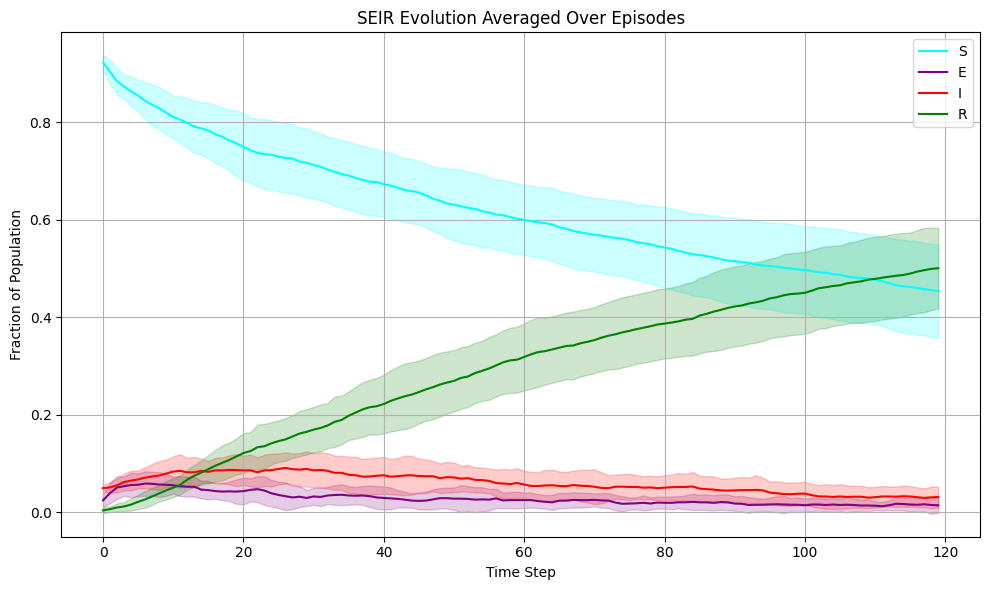

In [15]:
model = PPO.load("ppo_epidemic_rewiring")

# Factory for fresh graphs
graph_fn = lambda: nx.watts_strogatz_graph(n=cfg.n, k=cfg.k, p=cfg.p)

# Factory for environments with same config
def make_env(G):
    return PolicyBasedEpidemicEnv(
        graph=G,
        tmax=cfg.tmax,
        iif=cfg.initially_infected_fraction,
        rho=cfg.rho,
        te=cfg.TE,
        ti=cfg.TI,
        iota=cfg.iota,
        eta=cfg.eta,
        gamma=cfg.gamma,
        sigma=cfg.sigma,
        include_action_in_obs=False
    )

results = evaluate_policy_multiple_episodes(model, graph_fn, make_env, n_episodes=20, tmax=cfg.tmax)


In [16]:
# Load trained model
model = PPO.load("ppo_epidemic_rewiring")

G = nx.watts_strogatz_graph(n=cfg.n, k=cfg.k, p=cfg.p)
env = PolicyBasedEpidemicEnv(
    graph=G,
    tmax=cfg.tmax,
    iif=cfg.initially_infected_fraction,
    rho=cfg.rho,
    te=cfg.TE,
    ti=cfg.TI,
    iota=cfg.iota,
    eta=cfg.eta,
    gamma=cfg.gamma,
    sigma=cfg.sigma,
    debug=True
)
# Evaluate over one episode
obs, _ = env.reset()
done = False
total_reward = 0
while not done:
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, terminated, truncated, info = env.step(action.item())
    total_reward += reward

    env.render(mode="human")   # print summary

    done = terminated or truncated
    time.sleep(0.1)  # slow down for visibility

print(f"✅ Evaluation finished. Total reward: {total_reward:.2f}")
env.close()

[Moderate] Removed edges: SI=9, SE=0, Weak=100 | Added edges: SR/SS=85, SE=0
Infection penalty: -0.0600, Exposed penalty: -0.0200, Sociality bonus: 0.3780
Step   1 | S: 0.90, E: 0.04, I: 0.06, R: 0.00, AvgDeg: 0.63, Policy Chosen : [1] moderate_distancing
[Moderate] Removed edges: SI=6, SE=1, Weak=100 | Added edges: SR/SS=85, SE=2
Infection penalty: -0.0500, Exposed penalty: -0.0250, Sociality bonus: 0.3540
Step   2 | S: 0.88, E: 0.05, I: 0.05, R: 0.02, AvgDeg: 0.59, Policy Chosen : [1] moderate_distancing
[Moderate] Removed edges: SI=4, SE=1, Weak=100 | Added edges: SR/SS=85, SE=2
Infection penalty: -0.0700, Exposed penalty: -0.0300, Sociality bonus: 0.3360
Step   3 | S: 0.85, E: 0.06, I: 0.07, R: 0.02, AvgDeg: 0.56, Policy Chosen : [1] moderate_distancing
[Moderate] Removed edges: SI=3, SE=2, Weak=100 | Added edges: SR/SS=85, SE=2
Infection penalty: -0.0700, Exposed penalty: -0.0350, Sociality bonus: 0.3180
Step   4 | S: 0.84, E: 0.07, I: 0.07, R: 0.02, AvgDeg: 0.53, Policy Chosen : 

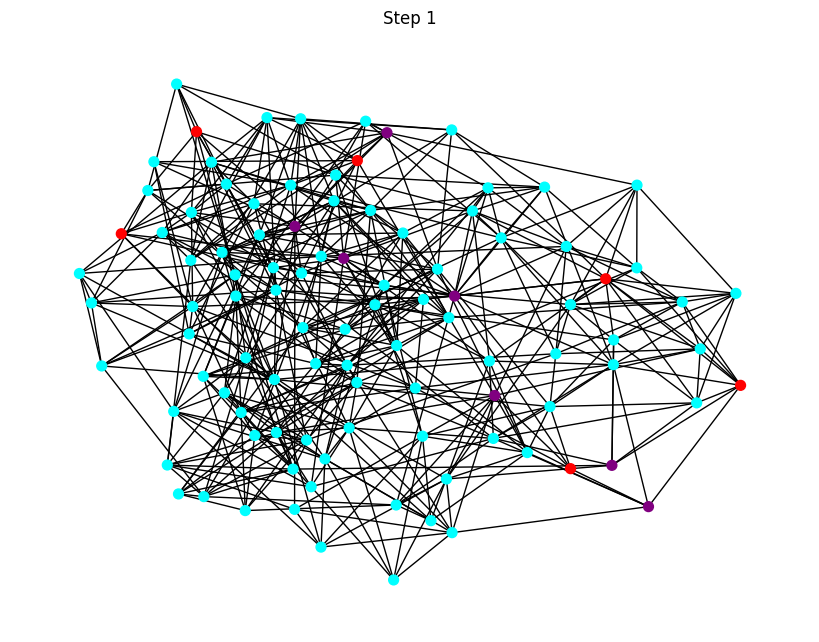

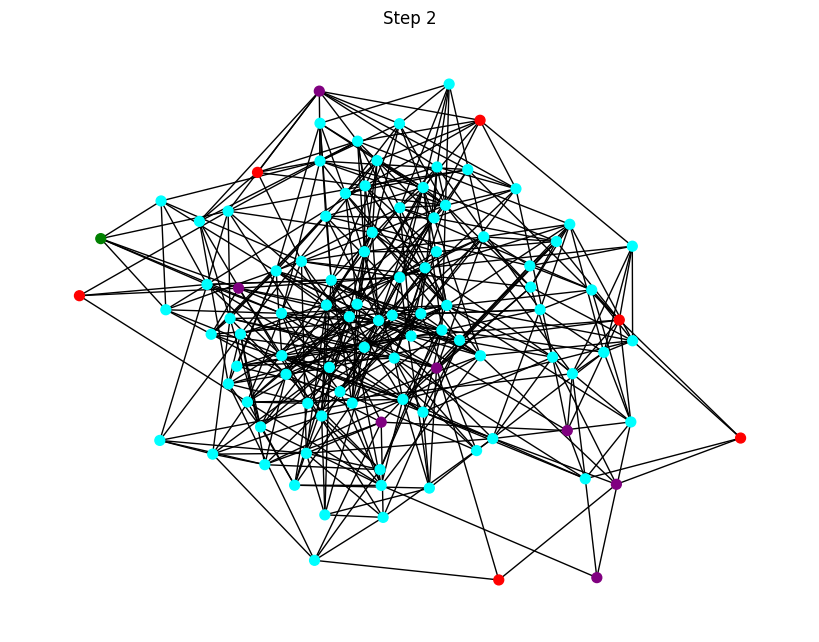

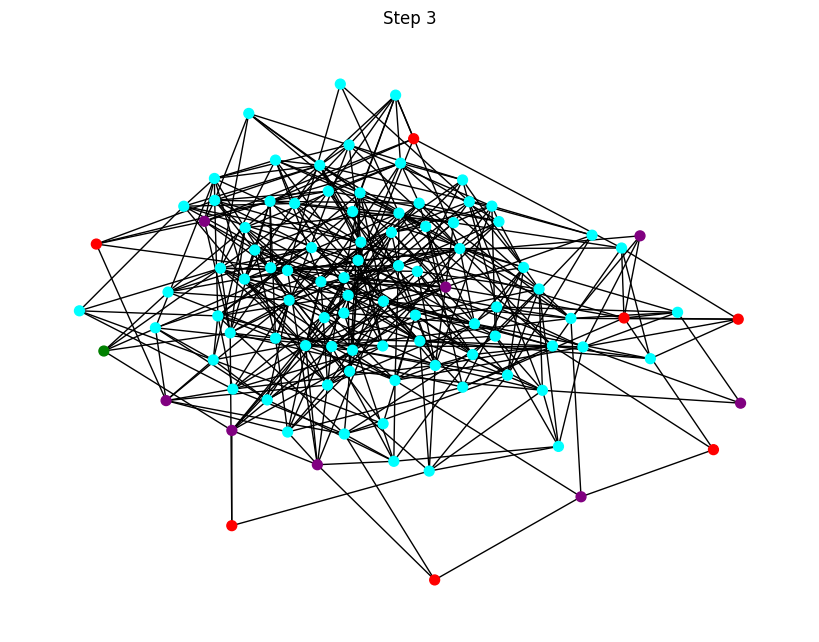

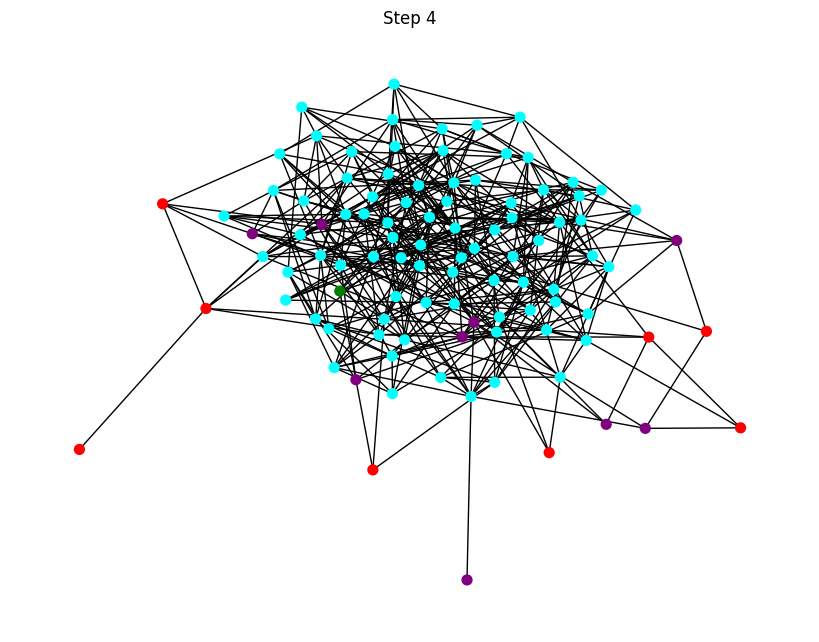

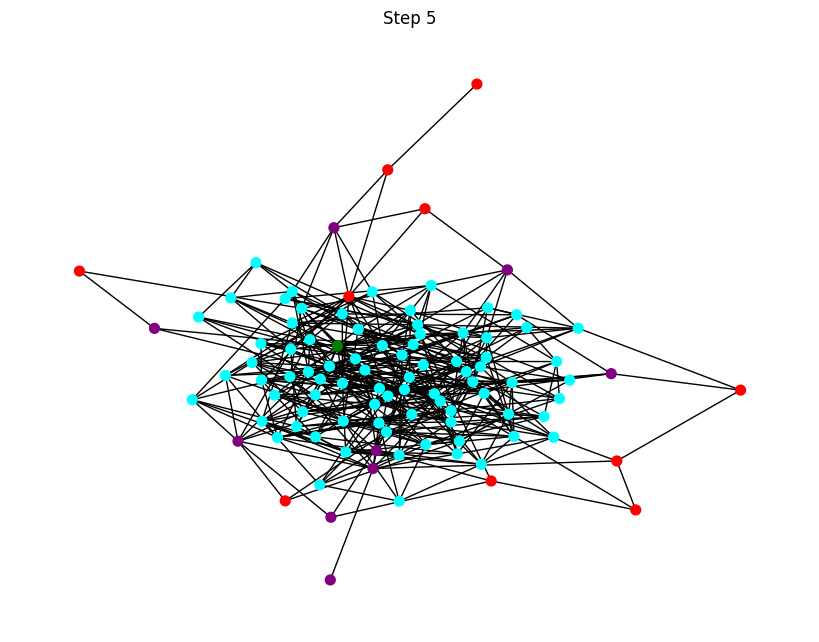

...

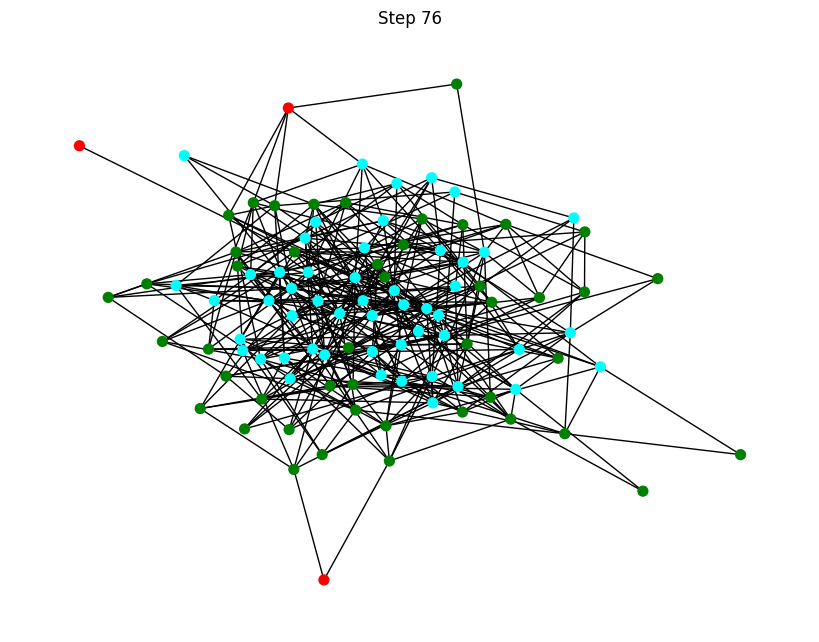

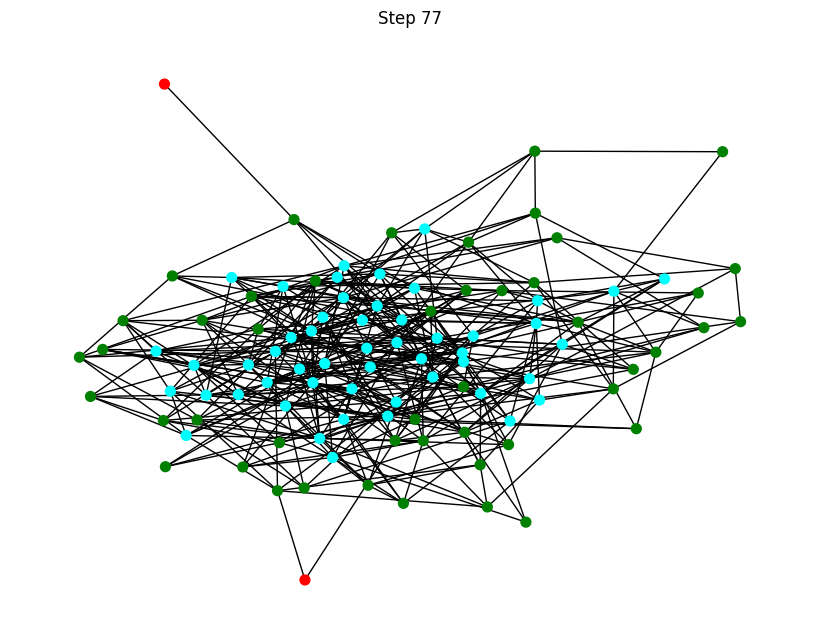

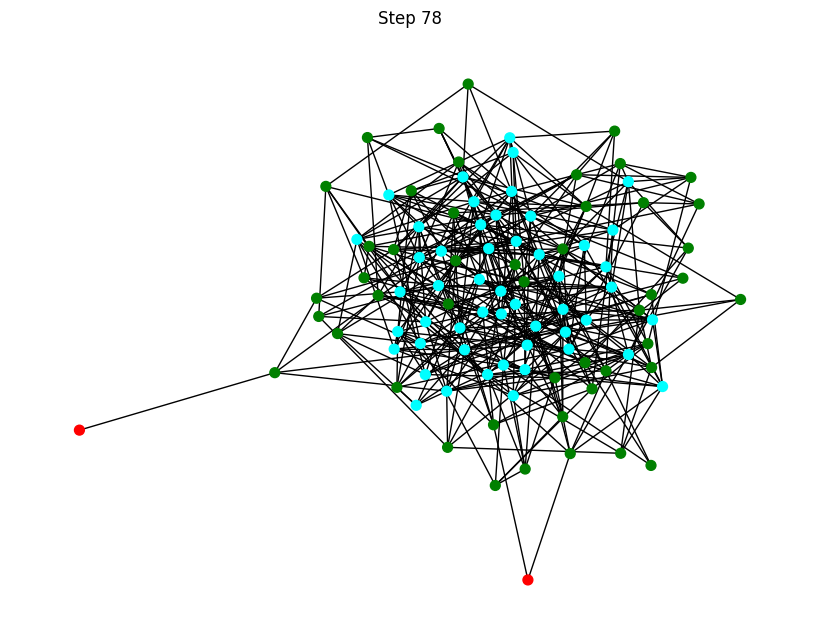

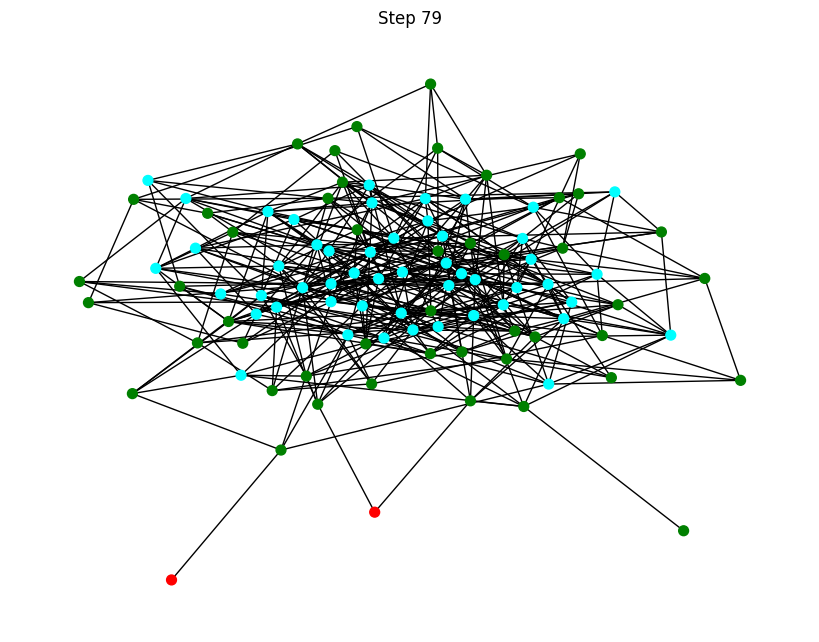

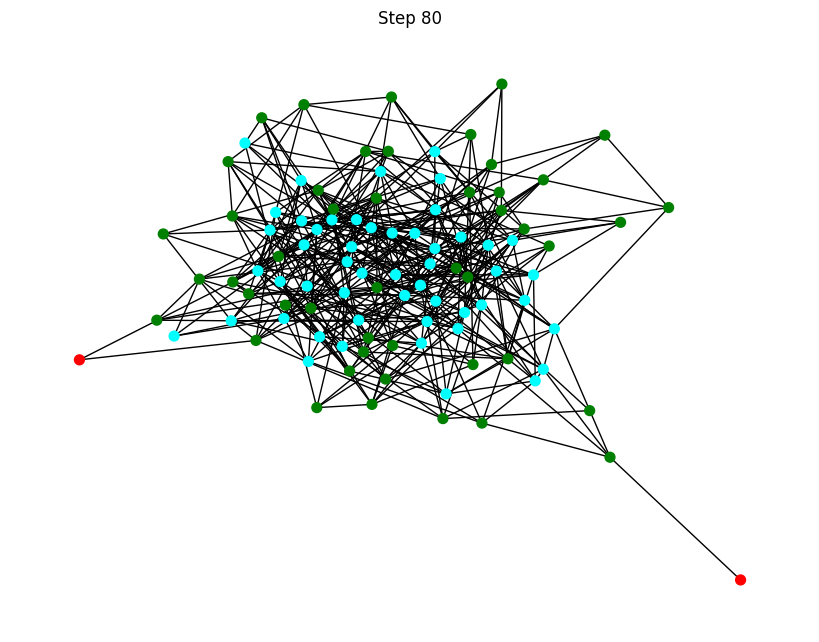

In [ ]:
# Load trained model
model = PPO.load("ppo_epidemic_rewiring")

env = PolicyBasedEpidemicEnv(
    graph=G,
    tmax=cfg.tmax,
    iif=cfg.initially_infected_fraction,
    rho=cfg.rho,
    te=cfg.TE,
    ti=cfg.TI,
    iota=cfg.iota,
    eta=cfg.eta,
    gamma=cfg.gamma,
    sigma=cfg.sigma,
    include_action_in_obs=False
)
# Evaluate over one episode
obs, _ = env.reset()
done = False
total_reward = 0
while not done:
    action, _states = model.predict(obs, deterministic=True)
    obs, reward, terminated, truncated, info = env.step(action.item())
    total_reward += reward

    env.render(mode="plot")  # plot network

    done = terminated or truncated
    time.sleep(0.8)  # slow down for visibility

print(f"✅ Evaluation finished. Total reward: {total_reward:.2f}")
env.close()